In [38]:
import os
import json
import matplotlib.pyplot as plt
from utils.data_utils import split_and_organize_dataset, \
    split_test_data_into_query_and_gallery
import random

In [2]:
# # extract train.zip into data/train
# def extract_train_data():
#     train_zip_path = '../train.zip'
#     if not os.path.exists('../data/train'):
#         os.makedirs('../data/train')
#     os.system(f'unzip -o {train_zip_path} -d ../data/train')

# extract_train_data()

In [3]:
# count all fines in the data train directory
def count_files_in_directory(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len(files)
    return count
count_files_in_directory('../data/train')

14034

In [39]:
with open("../results/submission.json", "r") as f:
    submission = json.load(f)

submission[:1]

[{'filename': '13d8b01b0023486c9b9aea89b9ca6309.jpg',
  'label': None,
  'samples': ['data/competition/test/gallery/a685da06f69e4f5d9bba7ccd9dd8f5b5.jpg',
   'data/competition/test/gallery/d938a06adf004ff6ae7b6e612e14e1af.jpg',
   'data/competition/test/gallery/127c3b76eb864800b40d3deded3ac32a.jpg',
   'data/competition/test/gallery/421a0eda3c1845e8a226753c5ec8b08c.jpg',
   'data/competition/test/gallery/781630c4195544d580214b8f59287a1d.jpg',
   'data/competition/test/gallery/fd3dcbac07c44839af6fe85eb21e5ab1.jpg',
   'data/competition/test/gallery/3fcf5cff2e2044b39b0521e2fb79ec9f.jpg',
   'data/competition/test/gallery/626b6798b7e6418fa75b76d7959fe3b3.jpg',
   'data/competition/test/gallery/6d05e052a53e43368880cd64848374ba.jpg',
   'data/competition/test/gallery/733580b0feec490ea8d97fccf049b725.jpg']}]

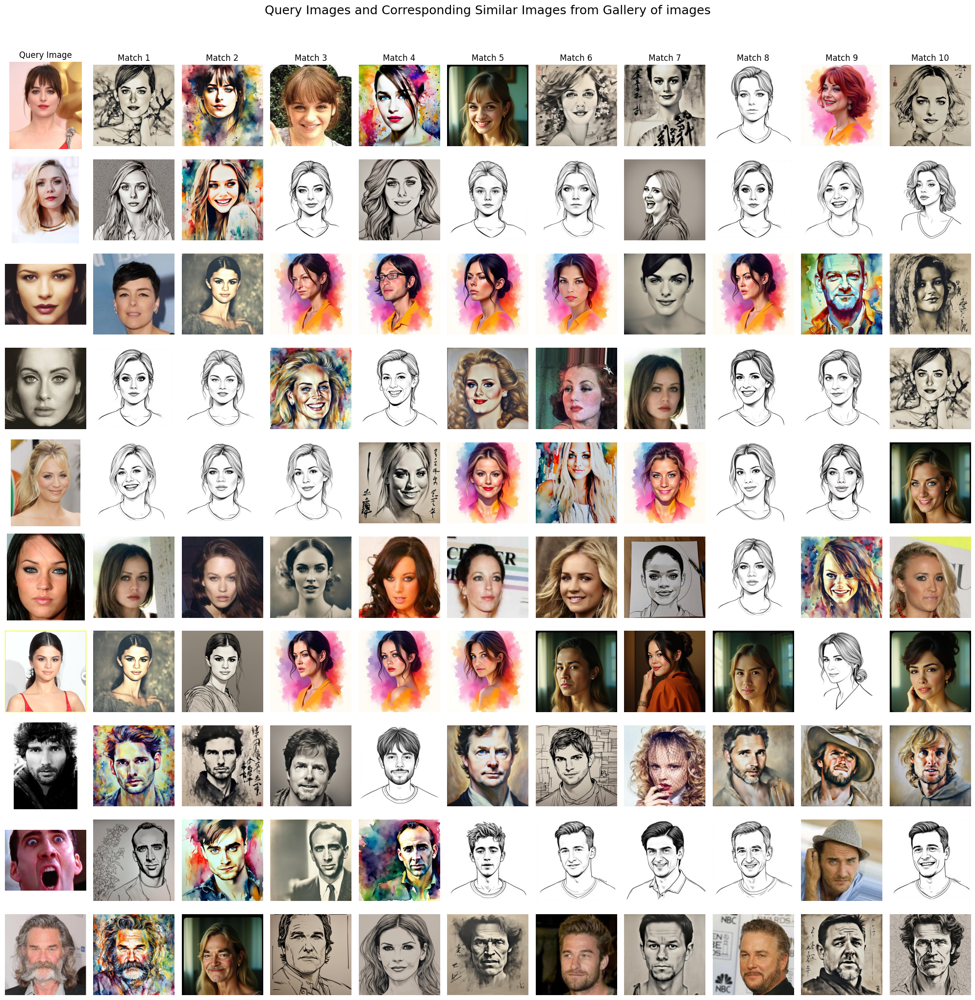

In [44]:
def visualize_facenet_results(submission, query_dir='../data/competition/test/query', num_samples=30, top_k=10):
    """Visualize the retrieval results"""
    
    if not submission:
        print("No submission data available.")
        return
    
    # Shuffle the list of submission
    random.shuffle(submission)
    # Limit the number of samples to display
    num_samples = min(num_samples, len(submission))
    
    fig, axes = plt.subplots(len(submission[:num_samples]), top_k + 1, figsize=(20, len(submission[:num_samples]) * 2))
    # how to add a margin between the suptitle and the first row of images
    axes[0, 0].set_title('Query Image')
    for i, item in enumerate(submission[:num_samples]):
        axes[i, 0].imshow(plt.imread(os.path.join(query_dir, item['filename'])))
        # axes[i, 0].set_title(f'Query Image')
        axes[i, 0].axis('off')
        for j, match in enumerate(item['samples']):
            axes[i, j + 1].imshow(plt.imread(os.path.join(f'../', match)))
            axes[0, j + 1].set_title(f'Match {j + 1}')
            axes[i, j + 1].axis('off')
    fig.suptitle('Query Images and Corresponding Similar Images from Gallery of images', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.savefig('../results/similar_images_query_in_gallery_competition_data.png', bbox_inches='tight')
    plt.show()

visualize_facenet_results(submission, '../data/competition/test/query', num_samples=10, top_k=10)

**Custom Dataset**

In [34]:
with open('../results/submission_custom.json') as f:
    submission_custom = json.load(f)
submission_custom[:1]

[{'filename': '21706.jpg',
  'label': 'buildings',
  'samples': ['data/test/gallery/buildings/21680.jpg',
   'data/test/gallery/buildings/20601.jpg',
   'data/test/gallery/buildings/20096.jpg',
   'data/test/gallery/buildings/21293.jpg',
   'data/test/gallery/buildings/23886.jpg',
   'data/test/gallery/street/20683.jpg',
   'data/test/gallery/buildings/20207.jpg',
   'data/test/gallery/buildings/22710.jpg',
   'data/test/gallery/buildings/20465.jpg',
   'data/test/gallery/buildings/23475.jpg']}]

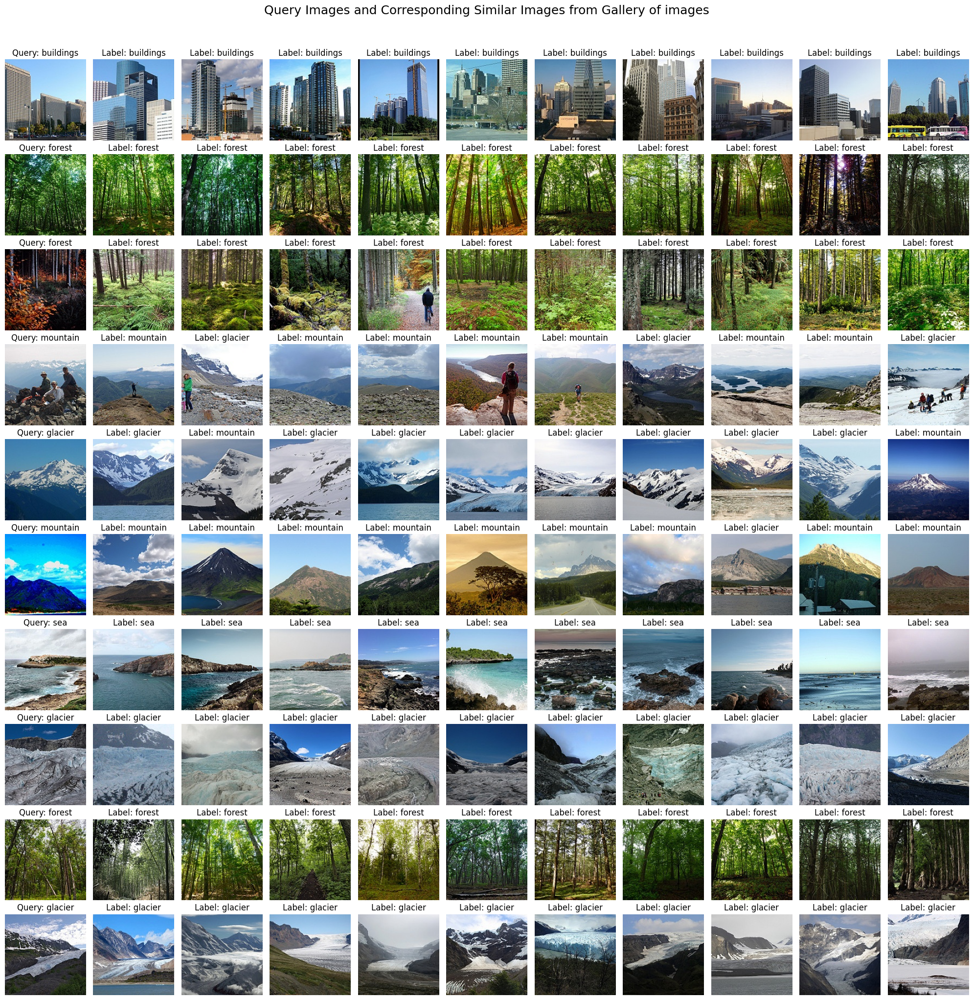

In [ ]:
import random
def get_resulting_similar_images_query_in_gallery(submission, 
                                                  num_samples=10, top_k=10, query_dir='../data/test/query'):
    """
    Display the query images and their corresponding similar images from the gallery.
    Args:
        submission (list): List of dictionaries containing query and sample image paths.
        num_samples (int): Number of similar images to display for each query.
    """
    if not submission:
        print("No submission data available.")
        return
    
    # Shuffle the list of submission
    random.shuffle(submission)
    # Limit the number of samples to display
    num_samples = min(num_samples, len(submission))
    
    fig, axes = plt.subplots(len(submission[:num_samples]), top_k + 1, figsize=(20, len(submission[:num_samples]) * 2))
    # how to add a margin between the suptitle and the first row of images
    axes[0, 0].set_title('Query Image')
    for i, item in enumerate(submission[:num_samples]):
        axes[i, 0].imshow(plt.imread(os.path.join(query_dir, item['filename'])))
        label = item['label']
        # display it in the image boottom
        axes[i, 0].set_title(f'Query: {label}')
        axes[i, 0].axis('off')
        for j, match in enumerate(item['samples']):
            label = match.split('/')[-2]
            axes[i, j + 1].set_title(f'Label: {label}')
            axes[i, j + 1].imshow(plt.imread(os.path.join(f'../', match)))
            # axes[0, j + 1].set_title(f'Match {j + 1}')
            axes[i, j + 1].axis('off')
    fig.suptitle('Query Images and Corresponding Similar Images from Gallery of images', fontsize=18, y=1.02)
    plt.tight_layout()
    plt.savefig('../results/similar_images_query_in_gallery_intel_dataset.png', bbox_inches='tight')
    plt.show()

get_resulting_similar_images_query_in_gallery(submission_custom, 
                                              num_samples=10, top_k=10)

In [29]:
from evaluate import calculate_top_k_accuracy
top_k = 3
top_k_accuracy, top_k_accuracy_per_class = calculate_top_k_accuracy('../results/submission_custom.json', top_k=top_k)

print(f'Top-{top_k} Accuracy: {top_k_accuracy:.2f}%')
print(f'Top-{top_k} Accuracy per Class:')
for cls, acc in top_k_accuracy_per_class.items():
    print(f'  {cls}: {acc:.2f}%')

Top-3 Accuracy: 97.77%
Top-3 Accuracy per Class:
  buildings: 98.47%
  forest: 100.00%
  glacier: 95.15%
  mountain: 96.82%
  sea: 98.04%
  street: 98.67%
